<a href="https://colab.research.google.com/github/robgon-art/creative_canvas/blob/main/Inpainting_with_Stable_Diffusion_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install  diffusers transformers ftfy accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 23.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.4/54.4 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.4/309.4 kB 22.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinu

In [ ]:
# import inspect
# from typing import List, Optional, Union
# import numpy as np
import torch
import PIL
# import gradio as gr
from diffusers import StableDiffusionInpaintPipeline

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [ ]:
device = "cuda"
model_path = "stabilityai/stable-diffusion-2-inpainting"

pipe = StableDiffusionInpaintPipeline.from_pretrained(
    model_path,
    torch_dtype=torch.float16,
).to(device)

model_index.json:   0%|          | 0.00/544 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/638 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/829 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/914 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

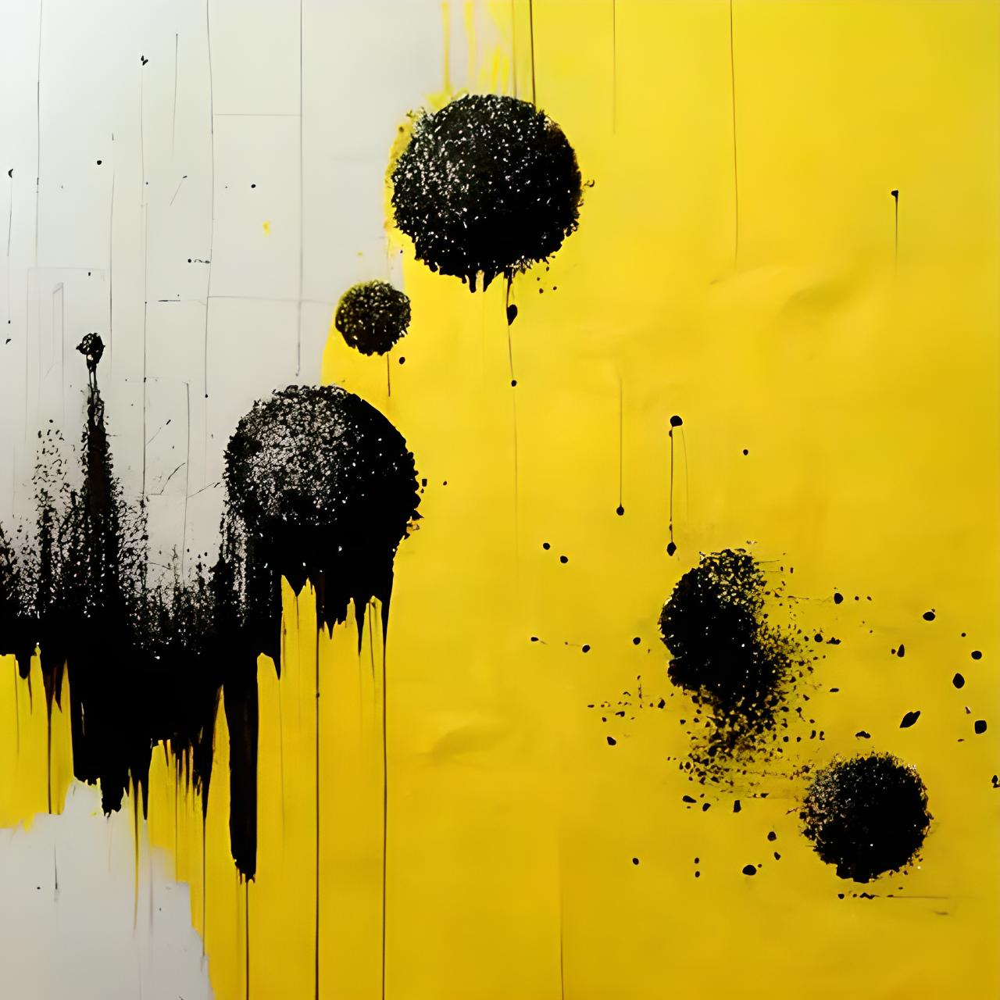

In [ ]:
from PIL import Image

# Define the size of the image
height, width = 1280, 1280

# Load and resize the image
image = Image.open("/content/abstract b 1.jpg").resize((width, height))
image.save('image.png')  # Save the resized image
image

In [ ]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = PIL.Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid


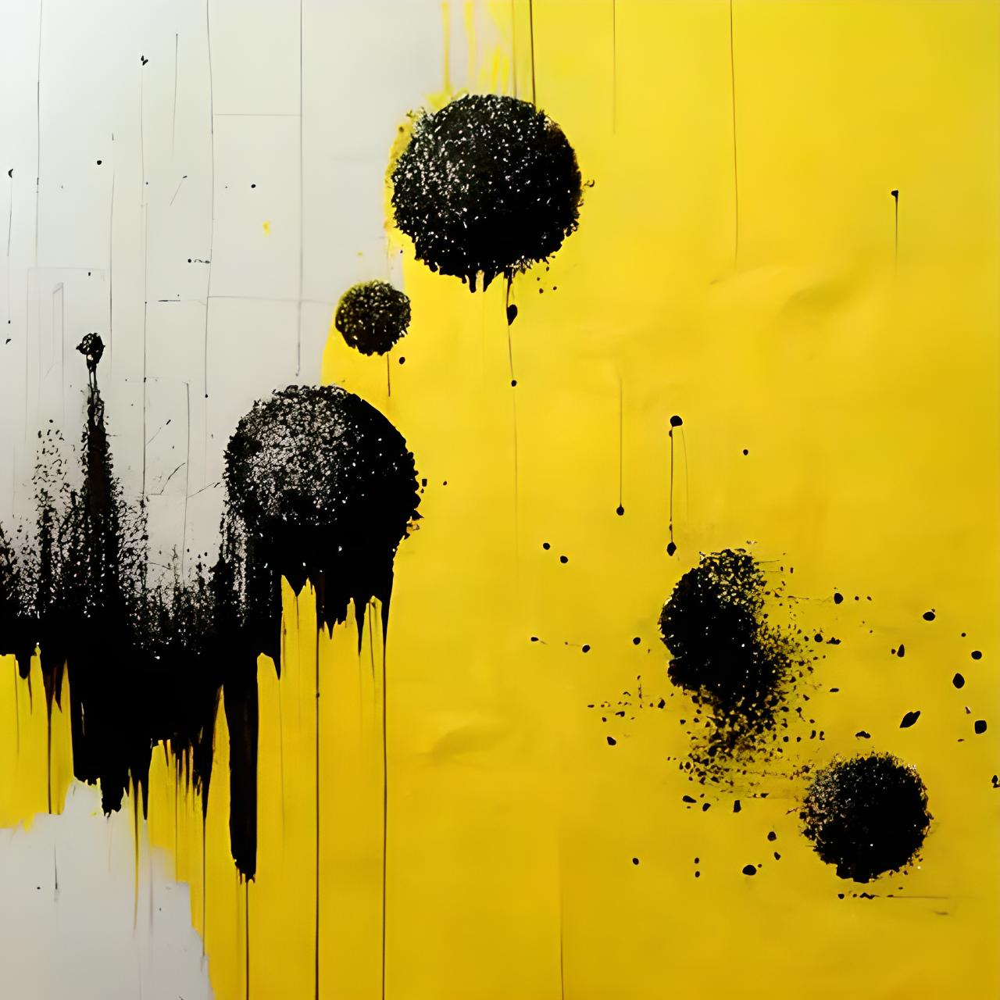

Mask saved


In [ ]:
from IPython.display import HTML
from base64 import b64encode

# Use the same function to embed the image in the canvas
data_url = None
with open('/content/image.png', 'rb') as img_file:
    data_url = 'data:image/png;base64,' + b64encode(img_file.read()).decode()

# Display the HTML and JavaScript interface
display(HTML(f'''
<canvas id="canvas" width="{width}" height="{height}" style="border:1px solid #000000;"></canvas>
<br>
<button onclick="getMask()">Get Mask</button>
<script>
var canvas = document.getElementById('canvas');
var ctx = canvas.getContext('2d');
var img = new Image();
img.src = '{data_url}';
img.onload = function() {{
    ctx.drawImage(img, 0, 0);
}}

canvas.addEventListener('mousemove', function(e) {{
    if (e.buttons == 1) {{
        var x = e.offsetX;
        var y = e.offsetY;
        ctx.fillStyle = 'rgba(255, 255, 255, 255)';
        ctx.beginPath(); ctx.arc(x, y, 50, 0, 2 * Math.PI); ctx.fill();
    }}
}});

canvas.addEventListener('mousedown', function(e) {{
    if (e.buttons == 1) {{
        var x = e.offsetX;
        var y = e.offsetY;
        ctx.fillStyle = 'rgba(255, 255, 255, 255)';
        ctx.beginPath(); ctx.arc(x, y, 50, 0, 2 * Math.PI); ctx.fill();
    }}
}});

function getMask() {{
    var mask = [];
    for (var y = 0; y < canvas.height; y++) {{
        var row = [];
        for (var x = 0; x < canvas.width; x++) {{
            var pixel = ctx.getImageData(x, y, 1, 1).data;
            row.push(pixel[0] == 255 && pixel[1] == 255 && pixel[2] == 255 ? 1 : 0);
        }}
        mask.push(row);
    }}
    google.colab.kernel.invokeFunction('notebook.save_mask', [mask], {{}});
}}
</script>
'''))

import numpy as np
import matplotlib.pyplot as plt

def save_mask(mask):
    mask_array = np.array(mask)
    np.save('/content/mask.npy', mask_array)
    plt.imsave('/content/mask.png', mask_array, cmap='gray')
    print('Mask saved')

# Register the callback function
from google.colab import output
output.register_callback('notebook.save_mask', save_mask)


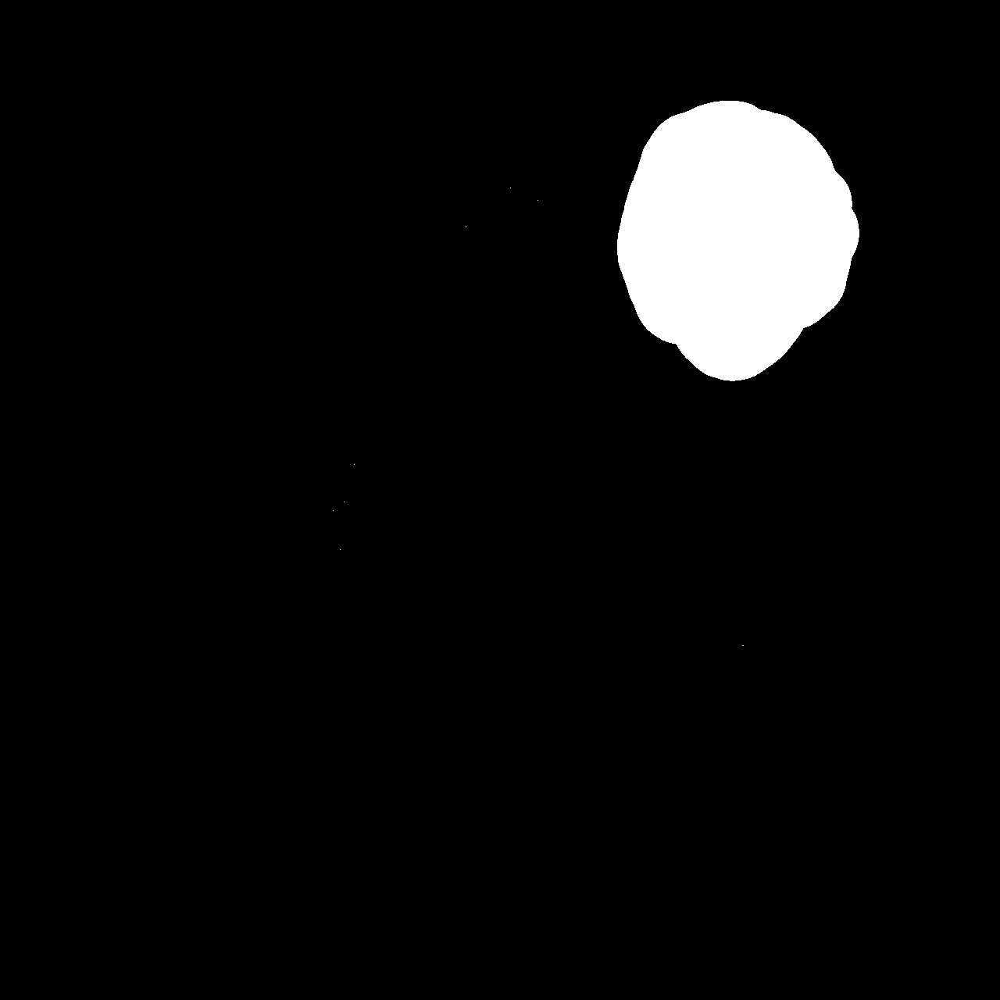

In [ ]:
mask_image = Image.open('/content/mask.png')
mask_image

  0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


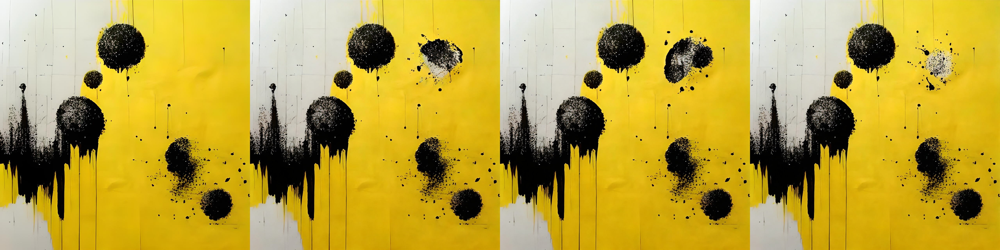

In [ ]:
prompt = "black ink splot with small white speckles"

num_samples = 3
generator = torch.Generator(device="cuda").manual_seed(21) # change the seed to get different results
images = pipe(
    prompt=prompt,
    image=image,
    mask_image=mask_image,
    guidance_scale=15.0,
    generator=generator,
    num_images_per_prompt=num_samples,
    num_inference_steps=50,
    strength=1.0,
    width=width,
    height=height,
).images

# insert initial image in the list so we can compare side by side
images.insert(0, image)
image_grid(images, 1, num_samples + 1)

In [ ]:
for i, im in enumerate(images):
  im.save(f'image{i}.png')
  print(f'image{i}.png')

image0.png
image1.png
image2.png
image3.png
